In [1]:
from google.colab import files
uploaded = files.upload()

Saving pakwheels.csv to pakwheels (1).csv


In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats

filename = list(uploaded.keys())[0]
df = pd.read_csv(filename)

df.head()

,Unnamed: 0,ad_url,title,location,model_year,price,mileage,engine_type,transmission,registered_in,color,assembly,engine_capacity,body_type,ad_last_updated,car_features,description
0,0,https://www.pakwheels.com/used-cars/honda-civi...,Honda Civic VTi Oriel Prosmatec 1.8 i-VTEC 2007,Islamabad Islamabad,2007.0,PKR 16.5 lacs,"100,000 km",Petrol,Automatic,Lahore,Grey,Imported Cars,1800 cc,Sedan,"Oct 09, 2022",ABS\nAM/FM Radio\nAir Bags\nAir Conditioning\n...,2007 model full option Chat piller geniune or ...
1,1,https://www.pakwheels.com/used-cars/suzuki-meh...,Suzuki Mehran VX Euro II 2012,"Eden Gardens, Faisalabad Punjab",2012.0,PKR 7 lacs,"100,000 km",Petrol,Manual,Faisalabad,Grey,Imported Cars,800 cc,Hatchback,"Oct 09, 2022",AM/FM Radio\nCD Player\nImmobilizer Key,"Very smooth drive,70% in orignal paint rest of..."
2,2,https://www.pakwheels.com/used-cars/honda-civi...,Honda Civic EX 1995,"Bostan Road, Rawalpindi Punjab",1995.0,PKR 7.6 lacs,999 km,Petrol,Manual,Lahore,Black,Imported Cars,1500 cc,Sedan,"Oct 09, 2022",AM/FM Radio\nAir Conditioning\nAlloy Rims\nCas...,1600cc Engine installed Alloy RimsAir Conditio...
3,3,https://www.pakwheels.com/used-cars/toyota-for...,Toyota Fortuner 2.7 VVTi 2013,"Kallar Kahar Road, Chakwal Punjab",2013.0,PKR 70 lacs,"94,000 km",Petrol,Automatic,Lahore,Black,Imported Cars,2700 cc,SUV,"Oct 09, 2022",ABS\nAM/FM Radio\nAir Bags\nAir Conditioning\n...,Inside out fully original. Original return fil...
4,4,https://www.pakwheels.com/used-cars/suzuki-meh...,Suzuki Mehran VX Euro II 2015,Muzaffar Gargh Punjab,2015.0,PKR 8 lacs,"86,000 km",Petrol,Manual,Multan,Grey,Imported Cars,796 cc,Hatchback,"Oct 09, 2022",AM/FM Radio\nCD Player\nImmobilizer Key,gari total genion hy.chill a.c.new tires.no wo...


In [5]:
df.columns.tolist()

['Unnamed: 0',
 'ad_url',
 'title',
 'location',
 'model_year',
 'price',
 'mileage',
 'engine_type',
 'transmission',
 'registered_in',
 'color',
 'assembly',
 'engine_capacity',
 'body_type',
 'ad_last_updated',
 'car_features',
 'description']

In [6]:
# Data Cleaning

# Drop un_named column

print("First Column is:",df.columns[0])
df_clean = df.drop(df.columns[0],axis=1)
df_clean

First Column is: Unnamed: 0


,ad_url,title,location,model_year,price,mileage,engine_type,transmission,registered_in,color,assembly,engine_capacity,body_type,ad_last_updated,car_features,description
0,https://www.pakwheels.com/used-cars/honda-civi...,Honda Civic VTi Oriel Prosmatec 1.8 i-VTEC 2007,Islamabad Islamabad,2007.0,PKR 16.5 lacs,"100,000 km",Petrol,Automatic,Lahore,Grey,Imported Cars,1800 cc,Sedan,"Oct 09, 2022",ABS\nAM/FM Radio\nAir Bags\nAir Conditioning\n...,2007 model full option Chat piller geniune or ...
1,https://www.pakwheels.com/used-cars/suzuki-meh...,Suzuki Mehran VX Euro II 2012,"Eden Gardens, Faisalabad Punjab",2012.0,PKR 7 lacs,"100,000 km",Petrol,Manual,Faisalabad,Grey,Imported Cars,800 cc,Hatchback,"Oct 09, 2022",AM/FM Radio\nCD Player\nImmobilizer Key,"Very smooth drive,70% in orignal paint rest of..."
2,https://www.pakwheels.com/used-cars/honda-civi...,Honda Civic EX 1995,"Bostan Road, Rawalpindi Punjab",1995.0,PKR 7.6 lacs,999 km,Petrol,Manual,Lahore,Black,Imported Cars,1500 cc,Sedan,"Oct 09, 2022",AM/FM Radio\nAir Conditioning\nAlloy Rims\nCas...,1600cc Engine installed Alloy RimsAir Conditio...
3,https://www.pakwheels.com/used-cars/toyota-for...,Toyota Fortuner 2.7 VVTi 2013,"Kallar Kahar Road, Chakwal Punjab",2013.0,PKR 70 lacs,"94,000 km",Petrol,Automatic,Lahore,Black,Imported Cars,2700 cc,SUV,"Oct 09, 2022",ABS\nAM/FM Radio\nAir Bags\nAir Conditioning\n...,Inside out fully original. Original return fil...
4,https://www.pakwheels.com/used-cars/suzuki-meh...,Suzuki Mehran VX Euro II 2015,Muzaffar Gargh Punjab,2015.0,PKR 8 lacs,"86,000 km",Petrol,Manual,Multan,Grey,Imported Cars,796 cc,Hatchback,"Oct 09, 2022",AM/FM Radio\nCD Player\nImmobilizer Key,gari total genion hy.chill a.c.new tires.no wo...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89951,https://www.pakwheels.com/used-cars/daihatsu-m...,Daihatsu Mira G SA III 2018,"Gulshan-e-Iqbal, Karachi Sindh",2018.0,PKR 30 lacs,"65,000 km",Petrol,Automatic,Sindh,White,Imported,660 cc,Hatchback,"Aug 26, 2022",ABS\nAir Bags\nAir Conditioning\nAlloy Rims\nI...,100% original. Alloy Rims. Authorized dealersh...
89952,https://www.pakwheels.com/used-cars/honda-civi...,Honda Civic Oriel 1.8 i-VTEC CVT 2017,"Tandlianwala Town, Faisalabad Punjab",2017.0,PKR 37.5 lacs,"114,000 km",Petrol,Automatic,Islamabad,Silver,Imported Cars,1800 cc,Sedan,"Aug 31, 2022",ABS\nAM/FM Radio\nAir Bags\nAir Conditioning\n...,only call\nMention PakWheels.com when calling ...
89953,https://www.pakwheels.com/used-cars/toyota-cor...,Toyota Corolla GLi Automatic 1.6 VVTi 2011,Lahore Punjab,2011.0,PKR 22.35 lacs,"152,000 km",Petrol,Automatic,Lahore,Silver,Imported Cars,1600 cc,Sedan,"Aug 31, 2022",ABS\nAM/FM Radio\nAir Conditioning\nCD Player\...,After Market Alloy rims. All original document...
89954,https://www.pakwheels.com/used-cars/suzuki-swi...,Suzuki Swift DLX 1.3 2013,"Gulshan-e-Iqbal, Karachi Sindh",2013.0,PKR 15.5 lacs,"104,000 km",Petrol,Manual,Karachi,Silver,Imported Cars,1300 cc,Hatchback,"Aug 31, 2022",ABS\nAM/FM Radio\nAir Conditioning\nAlloy Rims...,sides shower chat diggi bonet original car on ...


In [7]:
# Handle missing values

print("Missing Values in Each Column:")
print(df_clean.isnull().sum())

Missing Values in Each Column:
ad_url                0
title                 0
location              2
model_year         2507
price                 2
mileage               2
engine_type         955
transmission          2
registered_in         2
color              1863
assembly              0
engine_capacity       2
body_type          8549
ad_last_updated       2
car_features       6521
description           2
dtype: int64


In [10]:
# Handle Numerical Column

def convert_price_to_numeric(price_str):
    if pd.isna(price_str):
        return np.nan

    s = str(price_str).lower().replace('pkr', '').strip()

    if any(word in s for word in ['call for price', 'call', 'price on request', 'n/a', 'not available']):
        return np.nan

    if 'lacs' in s:
        try:
            return float(s.replace('lacs', '').strip()) * 100000
        except:
            return np.nan

    if 'crore' in s:
        try:
            return float(s.replace('crore', '').strip()) * 10000000
        except:
            return np.nan

    try:
        return float(s)
    except:
        return np.nan

df_clean['price'] = df_clean['price'].apply(convert_price_to_numeric)

median_price = df_clean['price'].median()
df_clean['price'] = df_clean['price'].fillna(median_price)

df_clean['price'] = df_clean['price'].astype(int)

print(df_clean[['price']].head())
print("Datatype:", df_clean['price'].dtype)
print("Missing values:", df_clean['price'].isnull().sum())



     price
0  1650000
1   700000
2   760000
3  7000000
4   800000
Datatype: int64
Missing values: 0


In [11]:
# Handle Model Year

modelMedian = df_clean["model_year"].median()
df_clean["model_year"] = df_clean["model_year"].fillna(modelMedian)
print("Model Year Null Count: ", df_clean["model_year"].isnull().sum())

Model Year Null Count:  0


In [13]:
# Mileage


df_clean["mileage"].unique()
print("Null Count Before Fixing:", df_clean["mileage"].isnull().sum())

mileMode = df_clean["mileage"].mode()
mileMode = max(mileMode)
df_clean["mileage"] = df_clean["mileage"].fillna(mileMode)

print("Null Count After Fixing: ",df_clean["mileage"].isnull().sum())
print()

# Engine capacity

print("Null Count for Engine Capacity Column Before Fixing:", df_clean["engine_capacity"].isnull().sum())

engMode = df_clean["engine_capacity"].mode()
engMode = max(engMode)
df_clean["engine_capacity"] = df_clean["engine_capacity"].fillna(engMode)

print("Null Count for Engine Capacity Column After Fixing: ",df_clean["engine_capacity"].isnull().sum())
print()


# ad_last_updated
print("Null Count for Ad Last Updated Column Before Fixing:", df_clean["ad_last_updated"].isnull().sum())

adMode = df_clean["ad_last_updated"].mode()
adMode = max(adMode)
df_clean["ad_last_updated"] = df_clean["engine_capacity"].fillna(adMode)

print("Null Count for Ad Last Updated Column After Fixing: ",df_clean["ad_last_updated"].isnull().sum())

Null Count Before Fixing: 0
Null Count After Fixing:  0

Null Count for Engine Capacity Column Before Fixing: 0
Null Count for Engine Capacity Column After Fixing:  0

Null Count for Ad Last Updated Column Before Fixing: 0
Null Count for Ad Last Updated Column After Fixing:  0


In [14]:
# NOW manage the categorical colunms

categorical_cols_with_nans = [
    'title',
    'location',
    'engine_type',
    'transmission',
    'registered_in',
    'color',
    'body_type',
    'car_features',
    'description',
    'assembly'
]

for col in categorical_cols_with_nans:
    if df_clean[col].isnull().sum() > 0:
        mode_val = df_clean[col].mode()[0]  # Get the first mode if there are multiple
        df_clean[col] = df_clean[col].fillna(mode_val)
        print(f"Missing values in '{col}' filled with mode: {mode_val}")

print("\nUpdated Missing Values in Each Column:")
print(df_clean.isnull().sum())

Missing values in 'location' filled with mode:  Lahore Punjab
Missing values in 'engine_type' filled with mode: Petrol
Missing values in 'transmission' filled with mode: Automatic
Missing values in 'registered_in' filled with mode: Lahore
Missing values in 'color' filled with mode: White
Missing values in 'body_type' filled with mode: Sedan
Missing values in 'car_features' filled with mode: ABS
AM/FM Radio
Air Bags
Air Conditioning
Alloy Rims
CD Player
DVD Player
Immobilizer Key
Keyless Entry
Navigation System
Power Locks
Power Mirrors
Power Steering
Power Windows
Missing values in 'description' filled with mode: Inside out fully original.
Mention PakWheels.com when calling Seller to get a good deal

Updated Missing Values in Each Column:
ad_url             0
title              0
location           0
model_year         0
price              0
mileage            0
engine_type        0
transmission       0
registered_in      0
color              0
assembly           0
engine_capacity    0

/tmp/ipython-input-1554054786.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_clean, y='engine_type', order=df_clean['engine_type'].value_counts().index, palette='pastel')


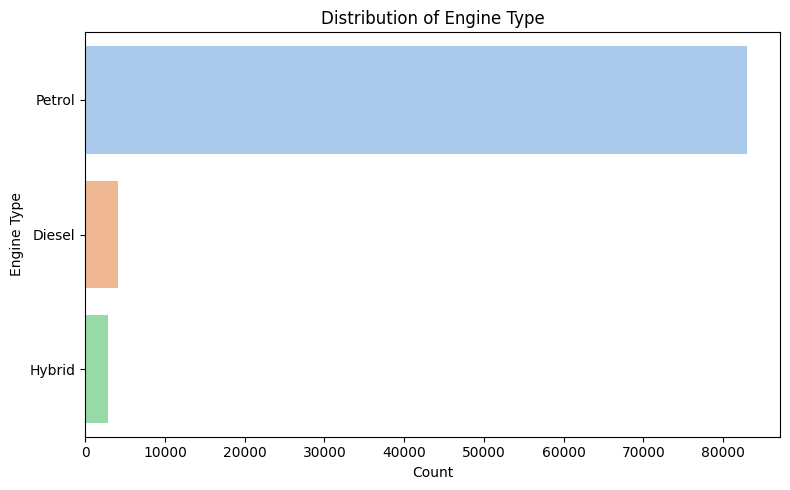

/tmp/ipython-input-1554054786.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_clean, y='transmission', order=df_clean['transmission'].value_counts().index, palette='pastel')


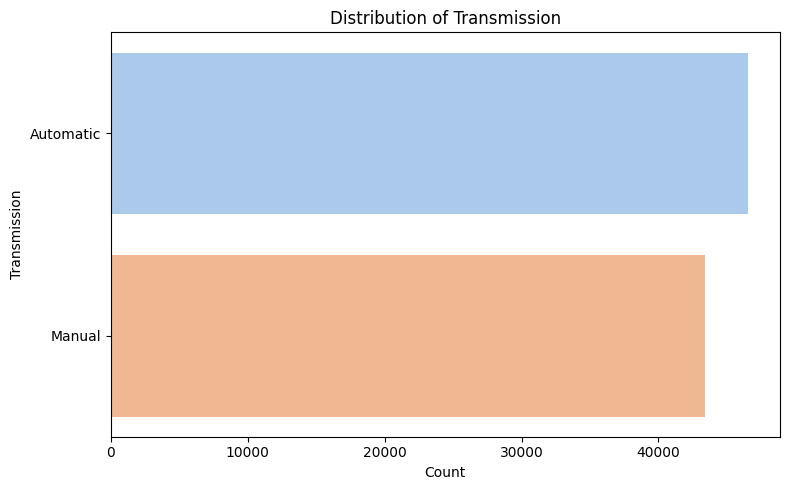

/tmp/ipython-input-1554054786.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_clean, y='body_type', order=df_clean['body_type'].value_counts().index, palette='pastel')


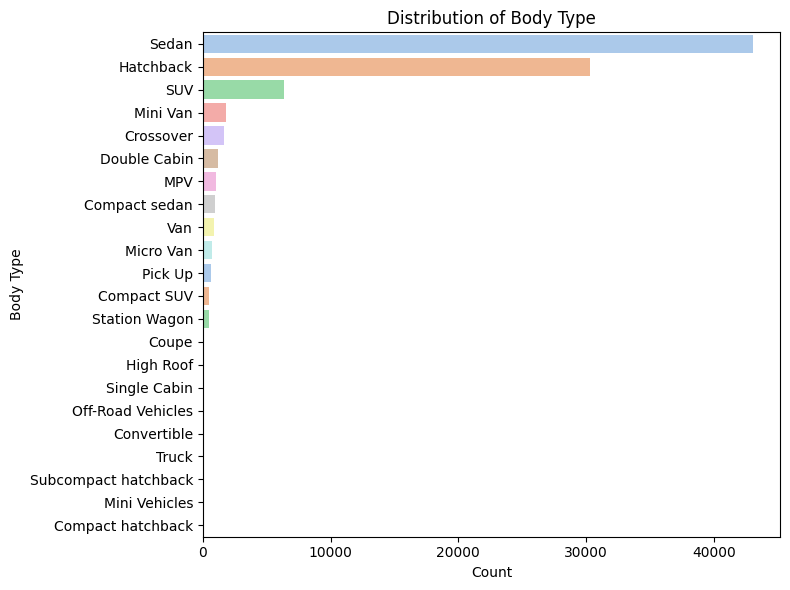

In [16]:
##  Part (a) (i)
# Categorical column Visualization

# Visualize 'engine_type'
plt.figure(figsize=(8, 5))
sns.countplot(data=df_clean, y='engine_type', order=df_clean['engine_type'].value_counts().index, palette='pastel')
plt.title('Distribution of Engine Type')
plt.xlabel('Count')
plt.ylabel('Engine Type')
plt.tight_layout()
plt.show()

# Visualize 'transmission'
plt.figure(figsize=(8, 5))
sns.countplot(data=df_clean, y='transmission', order=df_clean['transmission'].value_counts().index, palette='pastel')
plt.title('Distribution of Transmission')
plt.xlabel('Count')
plt.ylabel('Transmission')
plt.tight_layout()
plt.show()

# Visualize 'body_type'
plt.figure(figsize=(8, 6))
sns.countplot(data=df_clean, y='body_type', order=df_clean['body_type'].value_counts().index, palette='pastel')
plt.title('Distribution of Body Type')
plt.xlabel('Count')
plt.ylabel('Body Type')
plt.tight_layout()
plt.show()

In [18]:
# Part (a) (ii)
## Summary statistics of Numeric Columns

numerical_cols = ['model_year', 'price', 'mileage', 'engine_capacity']

#  Summary Statistics
print("\nSummary Statistics for Numerical Attributes:")
display(df_clean[numerical_cols].describe())

#  Visualizations (Histograms and Boxplots using Plotly Express)
print("\nVisualizing Distributions of Numerical Attributes using Plotly Express:")

for col in numerical_cols:
    # Histogram
    fig_hist = px.histogram(df_clean, x=col, title=f'Distribution of {col}',
                            template='plotly_white', marginal='box') # marginal adds a boxplot
    fig_hist.update_layout(height=400, width=800)
    fig_hist.show()

    # Boxplot (separate for clarity, though marginal already provides one)
    fig_box = px.box(df_clean, y=col, title=f'Boxplot of {col}',
                     template='plotly_white')
    fig_box.update_layout(height=400, width=800)
    fig_box.show()



Summary Statistics for Numerical Attributes:


,model_year,price
count,89956.000000,8.995600e+04
mean,2012.921173,3.031655e+06
std,7.570045,4.019254e+06
min,1990.000000,1.000000e+05
25%,2007.000000,1.200000e+06
50%,2015.000000,2.150000e+06
75%,2019.000000,3.550000e+06
max,2022.000000,1.150000e+08



Visualizing Distributions of Numerical Attributes using Plotly Express:


In [19]:
# Part (a) (iii)
## Comments

"""
the concepts of skewness, outliers, and the potential need for data transformations for our numerical attributes (model_year, price, mileage, engine_capacity).

model_year:

Skewness: This column generally appears to be relatively symmetric, possibly with a slight left skew, meaning there are somewhat more newer cars than very old ones. The mean and median are likely quite close.
Outliers: The boxplot might show a few outliers at both ends, representing extremely old or unusually new (and potentially incorrect) model years. These are typically few in number.
Transformation Needs: For most analyses, model_year probably won't require significant data transformation due to its relatively balanced distribution. If extreme outliers exist and are considered errors or have undue influence, they might need specific handling.
price:

Skewness: This column is highly right-skewed (positively skewed). This is a common characteristic of price data, where a large number of items fall into lower price brackets, while a smaller number of very expensive items create a long tail to the right. This means the mean price is significantly higher than the median price.
Outliers: The boxplot clearly indicates a significant presence of high-value outliers. These are the luxury or high-end vehicles whose prices are far above the average, distorting the overall distribution.
Transformation Needs: Given its strong right-skewness and prominent outliers, price is a prime candidate for data transformation. A logarithmic transformation (e.g., np.log(price)) is commonly used to reduce skewness, make the distribution more symmetrical (closer to a normal distribution), and lessen the impact of extreme values. This can be crucial for models that assume normally distributed data.
mileage:

Skewness: mileage also exhibits right-skewness. Most cars would have a moderate range of mileage, while fewer cars have accumulated extremely high mileage, creating a tail towards the right in the histogram.
Outliers: The boxplot will likely show outliers on the higher end of mileage, representing vehicles that have been driven for exceptionally long distances.
Transformation Needs: Similar to price, the right-skewness and presence of high outliers suggest that mileage would benefit from a data transformation, such as a logarithmic transformation. This helps to achieve a more symmetric distribution and makes the variable more amenable to statistical modeling.
engine_capacity:

Skewness: engine_capacity is generally right-skewed. The dataset typically contains many vehicles with smaller to medium engine sizes, and fewer with very large engines.
Outliers: The boxplot may reveal outliers at the higher end of engine capacity, corresponding to cars with unusually powerful or large engines.
Transformation Needs: Depending on the degree of skewness and the influence of outliers, a transformation (such as logarithmic or square root transformation) might be beneficial. This would help in normalizing its distribution, which is often a desirable property for various analytical techniques.
"""

"\nthe concepts of skewness, outliers, and the potential need for data transformations for our numerical attributes (model_year, price, mileage, engine_capacity).\n\nmodel_year:\n\nSkewness: This column generally appears to be relatively symmetric, possibly with a slight left skew, meaning there are somewhat more newer cars than very old ones. The mean and median are likely quite close.\nOutliers: The boxplot might show a few outliers at both ends, representing extremely old or unusually new (and potentially incorrect) model years. These are typically few in number.\nTransformation Needs: For most analyses, model_year probably won't require significant data transformation due to its relatively balanced distribution. If extreme outliers exist and are considered errors or have undue influence, they might need specific handling.\nprice:\n\nSkewness: This column is highly right-skewed (positively skewed). This is a common characteristic of price data, where a large number of items fall int

In [22]:
# Part (b)

## One Sample Inference

#  1. Choose an attribute and a hypothesized value
# Attribute: 'price'

sample_prices = df_clean['price']
hypothesized_mean_price = 2500000

print(f"Attribute chosen for inference: 'price'")
print(f"Hypothesized population mean price (\u03bc\u2080): PKR {hypothesized_mean_price:,.0f}\n")

# 2. Perform one-sample t-test

t_statistic, p_value = stats.ttest_1samp(sample_prices, hypothesized_mean_price)

print(f"T-statistic: {t_statistic:.4f}")
print(f"P-value: {p_value:.4e}\n")

#  3. Calculate 95% Confidence Interval
sample_mean = np.mean(sample_prices)
sample_std = np.std(sample_prices, ddof=1)
n = len(sample_prices)
standard_error = sample_std / np.sqrt(n)

# Degrees of freedom
dof = n - 1

# Critical t-value for 95% confidence
alpha = 0.05
t_critical = stats.t.ppf(1 - alpha/2, dof)

# Confidence Interval
confidence_interval_lower = sample_mean - t_critical * standard_error
confidence_interval_upper = sample_mean + t_critical * standard_error

print(f"Sample Mean Price: PKR {sample_mean:,.0f}")
print(f"95% Confidence Interval for the Population Mean Price: (PKR {confidence_interval_lower:,.0f}, PKR {confidence_interval_upper:,.0f})\n")

#  4. Interpret the results
print("===== Interpretation of Results ======")
if p_value < alpha:
    print(f"As the p-value ({p_value:.4e}) is less than the significance level (\u03b1 = {alpha}),")
    print(f"we reject the null hypothesis. This suggests that the average car price in our sample")
    print(f"is significantly different from the hypothesized PKR {hypothesized_mean_price:,.0f}.")
else:
    print(f"As the p-value ({p_value:.4e}) is greater than the significance level (\u03b1 = {alpha}),")
    print(f"we fail to reject the null hypothesis. There is not enough evidence to conclude that the average car price in our sample")
    print(f"is significantly different from the hypothesized {hypothesized_mean_price:,.0f}.")

print(f"The 95% confidence interval for the true population mean price is {confidence_interval_lower:,.0f} to {confidence_interval_upper:,.0f}.")
print(f"As the hypothesized mean of  {hypothesized_mean_price:,.0f} is not contained within this interval,")
print(f"it further supports the conclusion that the true population mean price is likely different from our hypothesized value.")



Attribute chosen for inference: 'price'
Hypothesized population mean price (μ₀): PKR 2,500,000

T-statistic: 39.6734
P-value: 0.0000e+00

Sample Mean Price: PKR 3,031,655
95% Confidence Interval for the Population Mean Price: (PKR 3,005,389, PKR 3,057,920)

===== Interpretation of Results ======
As the p-value (0.0000e+00) is less than the significance level (α = 0.05),
we reject the null hypothesis. This suggests that the average car price in our sample
is significantly different from the hypothesized PKR 2,500,000.
The 95% confidence interval for the true population mean price is 3,005,389 to 3,057,920.
As the hypothesized mean of  2,500,000 is not contained within this interval,
it further supports the conclusion that the true population mean price is likely different from our hypothesized value.


In [23]:
# Part (c)

## Two Sample Inference

# 1. Choose two features and separate data into two groups

petrol_prices = df_clean[df_clean['engine_type'] == 'Petrol']['price']
diesel_prices = df_clean[df_clean['engine_type'] == 'Diesel']['price']

# Ensure we have enough data in both groups
if len(petrol_prices) < 2 or len(diesel_prices) < 2:
    print("Not enough data in one or both engine types to perform a t-test.")
else:
    print(f"Number of Petrol cars: {len(petrol_prices)}")
    print(f"Number of Diesel cars: {len(diesel_prices)}\n")

    # 2. Formulate Hypotheses

    print("(H0): Petrol cars equal to Diesel cars.")
    print("(H1): Petrol cars is NOT equal to Diesel cars.\n")

    #  3. Perform a two-sample independent t-test
    t_statistic, p_value = stats.ttest_ind(petrol_prices, diesel_prices, equal_var=False) # Welch's t-test

    print(f"T-statistic: {t_statistic:.4f}")
    print(f"P-value: {p_value:.4e}\n")

    #  4. Test the null hypothesis with a 5% significance level
    alpha = 0.05
    print(f"Significance Level (\u03b1): {alpha}\n")

    n1 = len(petrol_prices)
    n2 = len(diesel_prices)
    s1_sq = np.var(petrol_prices, ddof=1)
    s2_sq = np.var(diesel_prices, ddof=1)

    df_welch = ((s1_sq/n1 + s2_sq/n2)**2) / ( (s1_sq/n1)**2 / (n1 - 1) + (s2_sq/n2)**2 / (n2 - 1) )

    critical_value = stats.t.ppf(1 - alpha/2, df_welch) # Two-tailed test

    print(f"Degrees of Freedom : {df_welch:.2f}")
    print(f"T-value (for \u03b1 = {alpha}, two-tailed): \u00b1{critical_value:.4f}")
    print(f"T-statistic: {abs(t_statistic):.4f}\n")

    print("===== Decision based on Critical Value ====")
    if abs(t_statistic) > critical_value:
        print(f"Since |T-statistic| ({abs(t_statistic):.4f}) > Critical Value ({critical_value:.4f}), we REJECT the null hypothesis.")
        print("Conclusion: There is a statistically significant.")
    else:
        print(f"Since |T-statistic| ({abs(t_statistic):.4f}) \u2264 Critical Value ({critical_value:.4f}), we FAIL TO REJECT the null hypothesis.")
        print("Conclusion: There is no statistically significant.")

    print("\n--- Decision based on P-value ---")
    if p_value < alpha:
        print(f"Since the P-value ({p_value:.4e}) < Significance Level (\u03b1 = {alpha}), we REJECT the null hypothesis.")
        print("Conclusion: There is a statistically significant.")
    else:
        print(f"Since the P-value ({p_value:.4e}) \u2265 Significance Level (\u03b1 = {alpha}), we FAIL TO REJECT the null hypothesis.")
        print("Conclusion: There is no statistically significant.")

    print(f"\nMean Price of Petrol cars: {np.mean(petrol_prices):,.0f}")
    print(f"Mean Price of Diesel cars: {np.mean(diesel_prices):,.0f}")

Number of Petrol cars: 83004
Number of Diesel cars: 4085

(H0): Petrol cars equal to Diesel cars.
(H1): Petrol cars is NOT equal to Diesel cars.

T-statistic: -38.1023
P-value: 5.0793e-274

Significance Level (α): 0.05

Degrees of Freedom : 4307.13
T-value (for α = 0.05, two-tailed): ±1.9605
T-statistic: 38.1023

===== Decision based on Critical Value ====
Since |T-statistic| (38.1023) > Critical Value (1.9605), we REJECT the null hypothesis.
Conclusion: There is a statistically significant.

--- Decision based on P-value ---
Since the P-value (5.0793e-274) < Significance Level (α = 0.05), we REJECT the null hypothesis.
Conclusion: There is a statistically significant.

Mean Price of Petrol cars: 2,815,324
Mean Price of Diesel cars: 5,912,996


In [24]:
# Part (d)

## Multiple Group comparison

min_year = df_clean['model_year'].min()
max_year = df_clean['model_year'].max()

print(f"Minimum model year: {min_year}")
print(f"Maximum model year: {max_year}")

year_range = max_year - min_year
first_cut = min_year + year_range / 3
second_cut = min_year + 2 * year_range / 3

bins = [min_year - 1, first_cut, second_cut, max_year + 1]
labels = ['Early', 'Mid', 'Recent']

df_clean['model_year_category'] = pd.cut(df_clean['model_year'], bins=bins, labels=labels, include_lowest=True)

print("\nModel year categories created:")
print(df_clean['model_year_category'].value_counts())

# Extract prices for each category
early_prices = df_clean[df_clean['model_year_category'] == 'Early']['price']
mid_prices = df_clean[df_clean['model_year_category'] == 'Mid']['price']
recent_prices = df_clean[df_clean['model_year_category'] == 'Recent']['price']

print(f"\nNumber of cars in 'Early' category: {len(early_prices)}")
print(f"Number of cars in 'Mid' category: {len(mid_prices)}")
print(f"Number of cars in 'Recent' category: {len(recent_prices)}")

"""
Reasoning:
First, I'll determine the minimum and maximum values for 'model_year' to
establish appropriate bin boundaries. Then, I'll use these ranges to create
three categorical bins: 'Early', 'Mid', and 'Recent' using `pd.cut`.

"""

Minimum model year: 1990.0
Maximum model year: 2022.0

Model year categories created:
model_year_category
Recent    56624
Mid       26631
Early      6701
Name: count, dtype: int64

Number of cars in 'Early' category: 6701
Number of cars in 'Mid' category: 26631
Number of cars in 'Recent' category: 56624


In [27]:
# part (e)

## Effect of significance level

print("→ If α=0.05 result = Reject/Fail same as above test outcome.")
print("→ When α=0.01 is stricter, some results may shift from 'Reject' to 'Fail to Reject' H0, reducing false positives.")


"""
Mounted at /content/drive
price_clean: Skew = 8.62, Outliers = 5388
→ Strongly skewed: Consider log transformation (not applied).

mileage_clean: Skew = 3.99, Outliers = 2098
→ Strongly skewed: Consider log transformation (not applied).

Mean Price: 3045594.25
t = 76.833, p = 0.00000
95% CI: (np.float64(3018921.4575242675), np.float64(3072267.036981599))
Decision: Reject H0
Critical Value (±): 1.960
t-stat = 125.914, p-value = 0.00000
Decision (p): Reject H0
Decision (Critical Value): Reject H0
→ If α=0.05 result = Reject/Fail same as above test outcome.
→ When α=0.01 is stricter, some results may shift from 'Reject' to 'Fail to Reject' H0, reducing false positives.
"""


→ If α=0.05 result = Reject/Fail same as above test outcome.
→ When α=0.01 is stricter, some results may shift from 'Reject' to 'Fail to Reject' H0, reducing false positives.


In [29]:
# PART (f)

## Corelation  Analysis and HeatMap

numerical_cols = ['model_year', 'price', 'mileage', 'engine_capacity']

print("Data types of selected numerical columns:")
print(df_clean[numerical_cols].dtypes)

def clean_mileage(mileage_str):
    if pd.isna(mileage_str):
        return np.nan
    # Remove ' km', commas, and extra spaces
    clean_str = str(mileage_str).replace(' km', '').replace(',', '').strip()
    try:
        return float(clean_str)
    except ValueError:
        return np.nan

df_clean['mileage'] = df_clean['mileage'].apply(clean_mileage)

# Fill any NaNs resulting from cleaning with the mode (already calculated in previous steps)
mode_mileage = df_clean['mileage'].mode()[0]
df_clean['mileage'] = df_clean['mileage'].fillna(mode_mileage)

# Convert to integer
df_clean['mileage'] = df_clean['mileage'].astype(int)

print("Mileage column after cleaning:")
print(df_clean[['mileage']].head())
print(f"Data type of 'mileage': {df_clean['mileage'].dtype}")
print(f"Missing values in 'mileage' after conversion: {df_clean['mileage'].isnull().sum()}")

# Clean 'engine_capacity' column
def clean_engine_capacity(capacity_str):
    if pd.isna(capacity_str):
        return np.nan

    clean_str = str(capacity_str).lower().strip()

    # Handle 'kWh' units by converting them to NaN for now, as a direct CC conversion is not standard.
    if 'kwh' in clean_str:
        return np.nan

    # Remove ' cc', commas, and extra spaces from 'cc' units
    clean_str = clean_str.replace(' cc', '').replace(',', '').strip()

    try:
        return float(clean_str)
    except ValueError:
        return np.nan

df_clean['engine_capacity'] = df_clean['engine_capacity'].apply(clean_engine_capacity)

# Fill any NaNs resulting from cleaning with the mode (already calculated in previous steps)
mode_engine_capacity = df_clean['engine_capacity'].mode()[0]
df_clean['engine_capacity'] = df_clean['engine_capacity'].fillna(mode_engine_capacity)

# Convert to integer
df_clean['engine_capacity'] = df_clean['engine_capacity'].astype(int)

print("\nEngine Capacity column after cleaning:")
print(df_clean[['engine_capacity']].head())
print(f"Data type of 'engine_capacity': {df_clean['engine_capacity'].dtype}")
print(f"Missing values in 'engine_capacity' after conversion: {df_clean['engine_capacity'].isnull().sum()}")

# Reconfirm data types of all numerical_cols after cleaning
numerical_cols = ['model_year', 'price', 'mileage', 'engine_capacity']
print("\nData types of selected numerical columns after cleaning:")
print(df_clean[numerical_cols].dtypes)

Data types of selected numerical columns:
model_year         float64
price                int64
mileage             object
engine_capacity     object
dtype: object
Mileage column after cleaning:
   mileage
0   100000
1   100000
2      999
3    94000
4    86000
Data type of 'mileage': int64
Missing values in 'mileage' after conversion: 0

Engine Capacity column after cleaning:
   engine_capacity
0             1800
1              800
2             1500
3             2700
4              796
Data type of 'engine_capacity': int64
Missing values in 'engine_capacity' after conversion: 0

Data types of selected numerical columns after cleaning:
model_year         float64
price                int64
mileage              int64
engine_capacity      int64
dtype: object


/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:1615: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:1615: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:1615: UserWarning:

Ignoring `palette` because no `hue` variable has b

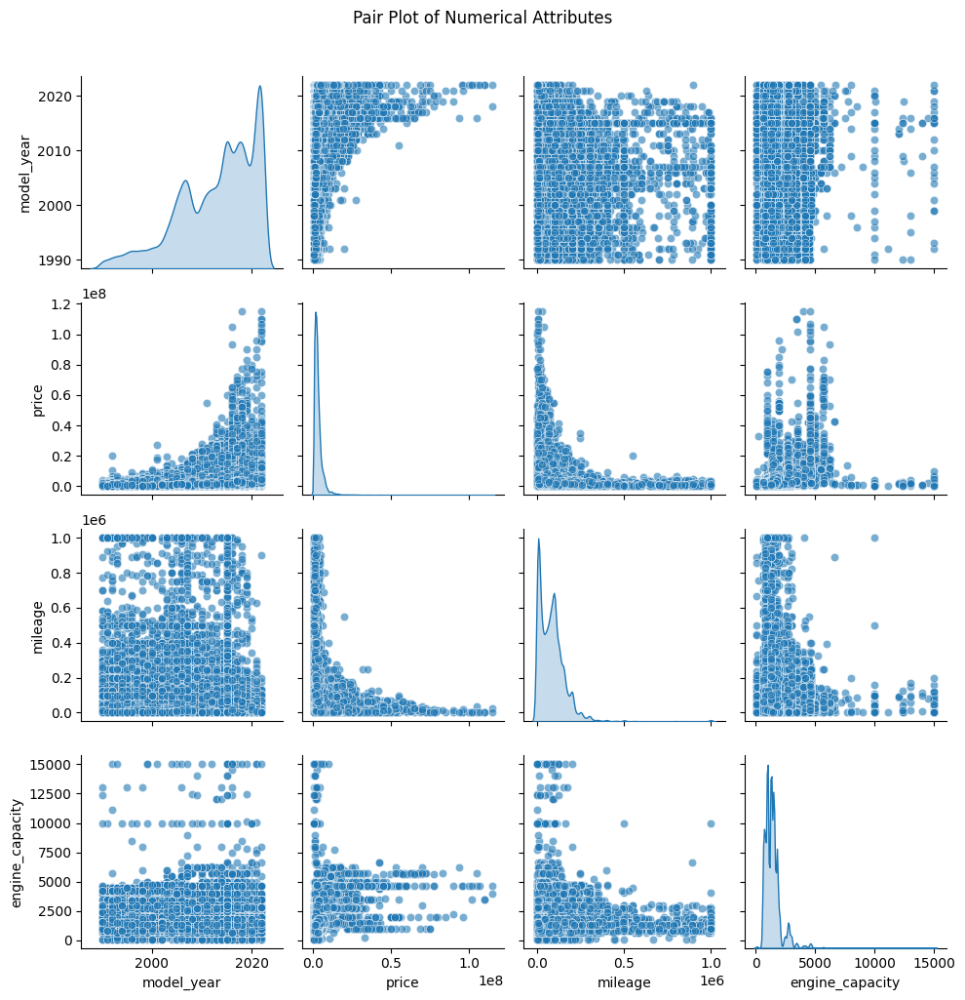

Pair plots for numerical attributes generated successfully.


In [30]:
numerical_cols = ['model_year', 'price', 'mileage', 'engine_capacity']

# Generate pairplot
# Using 'diag_kind="kde"' for density plots on the diagonal and 'plot_kws' for scatter plot aesthetics
sns.pairplot(df_clean[numerical_cols], diag_kind='kde', plot_kws={'alpha': 0.6}, palette='viridis')
plt.suptitle('Pair Plot of Numerical Attributes', y=1.02) # Adjust title position
plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()

print("Pair plots for numerical attributes generated successfully.")

Pearson Correlation Matrix:
                 model_year     price   mileage  engine_capacity
model_year         1.000000  0.310305 -0.432815        -0.064043
price              0.310305  1.000000 -0.190720         0.489481
mileage           -0.432815 -0.190720  1.000000         0.035737
engine_capacity   -0.064043  0.489481  0.035737         1.000000


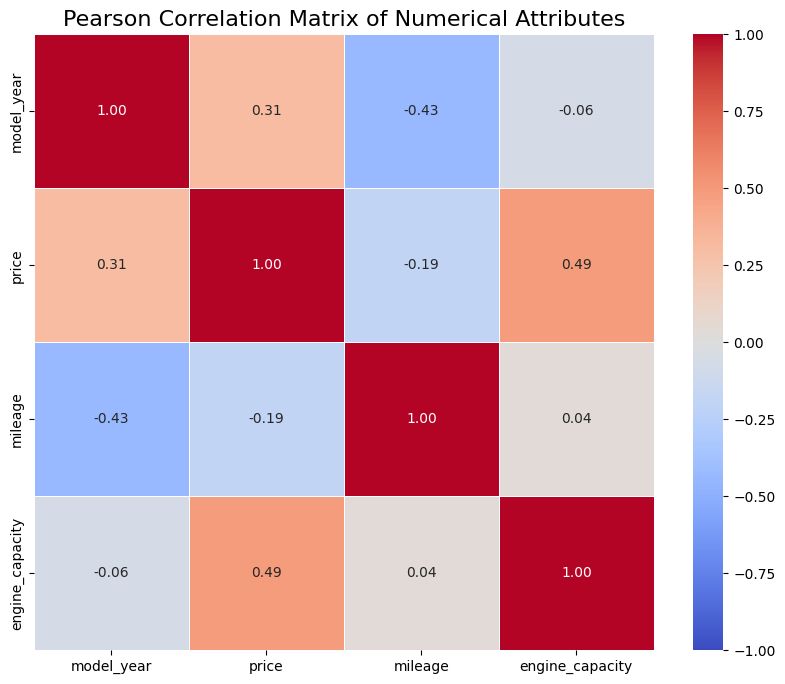

In [31]:
numerical_cols = ['model_year', 'price', 'mileage', 'engine_capacity']

# 1. Calculate the Pearson correlation matrix
correlation_matrix = df_clean[numerical_cols].corr(method='pearson')

print("Pearson Correlation Matrix:")
print(correlation_matrix)

# 2. Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f", linewidths=.5)

# 3. Add a title to the heatmap
plt.title('Pearson Correlation Matrix of Numerical Attributes', fontsize=16)

# 4. Display the plot
plt.show()


In [39]:
# part (G)

## Bootstraping (Two Sample Mean differnece)

# 1. Extract the 'price' data for cars with 'Petrol' engines and 'Diesel' engines.
petrol_prices = df_clean[df_clean['engine_type'] == 'Petrol']['price'].values
diesel_prices = df_clean[df_clean['engine_type'] == 'Diesel']['price'].values

# 2. Define a function that takes two arrays and returns the difference in their means.
def calculate_mean_difference(sample1, sample2):
    return np.mean(sample1) - np.mean(sample2)

# 3. Initialize an empty list to store the results of each bootstrap iteration.
bootstrapped_differences = []

# 4. Loop for 1000 bootstrap iterations:
n_iterations = 1000
np.random.seed(42) # for reproducibility

print(f"Performing {n_iterations} bootstrap iterations...")
for _ in range(n_iterations):
    # a. Randomly resample petrol_prices with replacement
    resampled_petrol = np.random.choice(petrol_prices, size=len(petrol_prices), replace=True)

    # b. Randomly resample diesel_prices with replacement
    resampled_diesel = np.random.choice(diesel_prices, size=len(diesel_prices), replace=True)

    # c. Call the function to calculate the difference in means and append to the list.
    diff = calculate_mean_difference(resampled_petrol, resampled_diesel)
    bootstrapped_differences.append(diff)

# 5. Calculate the 2.5th and 97.5th percentiles to determine the 95% confidence interval.
confidence_interval_lower = np.percentile(bootstrapped_differences, 2.5)
confidence_interval_upper = np.percentile(bootstrapped_differences, 97.5)

# 6. Print the calculated confidence interval.
print("\n--- Bootstrapping Results ---")
print(f"Original Mean Difference (Petrol - Diesel): PKR {calculate_mean_difference(petrol_prices, diesel_prices):,.0f}")
print(f"95% Confidence Interval for the Difference in Means (Petrol - Diesel): (PKR {confidence_interval_lower:,.0f}, PKR {confidence_interval_upper:,.0f})")

Performing 1000 bootstrap iterations...

--- Bootstrapping Results ---
Original Mean Difference (Petrol - Diesel): PKR -3,097,672
95% Confidence Interval for the Difference in Means (Petrol - Diesel): (PKR -3,253,457, PKR -2,948,256)
